# Population Distributions

In [ ]:
using Rasters, ArchGDAL
using GeoJSON
using Plots
using ImageTransformations

In [ ]:
using PolygonAlgorithms
using PolygonAlgorithms: x_coords, y_coords

In [ ]:
using Revise
includet("modules/geoJSON.jl")
includet("modules/projection.jl")
includet("modules/affine.jl")
includet("modules/reproject.jl")

In [ ]:
bilinear = ImageTransformations.BSpline(ImageTransformations.Linear())

BSpline(Linear())

## Boundary Data

Source: https://www.geoboundaries.org/

London

In [ ]:
london_boroughs = Set([
    "City of London", "Westminster", "Kensington and Chelsea", "Hammersmith and Fulham", "Wandsworth", "Lambeth",
    "Southwark", "Tower Hamlets", "Hackney", "Islington", "Camden", "Brent", "Ealing", "Hounslow", "Richmond upon Thames",
    "Kingston upon Thames", "Merton", "Sutton", "Croydon", "Bromley", "Lewisham", "Greenwich", "Bexley", "Havering",
    "Barking and Dagenham", "Redbridge", "Newham", "Waltham Forest","Haringey", "Enfield", "Barnet", "Harrow",
    "Hillingdon"
]);
inner_city_boroughs = Set([
    "Islington", "Camden", "Westminster", "Southwark", "Tower Hamlets", "Hackney", "Lambeth"
]);

In [ ]:
data_dir = "C:\\Users\\sinai\\Documents\\Projects\\Python\\Geospatial\\data"
geojson_filepath = joinpath(data_dir, "geoBoundaries-GBR-ADM2-all\\geoBoundaries-GBR-ADM2.geojson");
shape_data = GeoJSON.read(geojson_filepath)

FeatureCollection with 216 Features

In [ ]:
london_borough_features = filter_features(shape_data, :shapeName, london_boroughs);

## Plotting

In [ ]:
function plot_geometry!(canvas, geometry::GeoJSON.AbstractGeometry; options...)
    throw("Feature geomtery of $type_ is not supported")
end

function plot_geometry!(canvas, geometry::GeoJSON.Polygon; options...)
    xs = x_coords(geometry.coordinates[1])
    ys = y_coords(geometry.coordinates[1])
    plot!(canvas, xs, ys; options...)
end

function plot_geometry!(canvas, geometry::GeoJSON.MultiPolygon; options...)
    for coords in geometry.coordinates
        xs = x_coords(coords[1])
        ys = y_coords(coords[1])
        plot!(canvas, xs, ys; options...)
    end
    canvas
end

plot_geometry! (generic function with 3 methods)

In [ ]:
features = london_borough_features
region_name = "London";

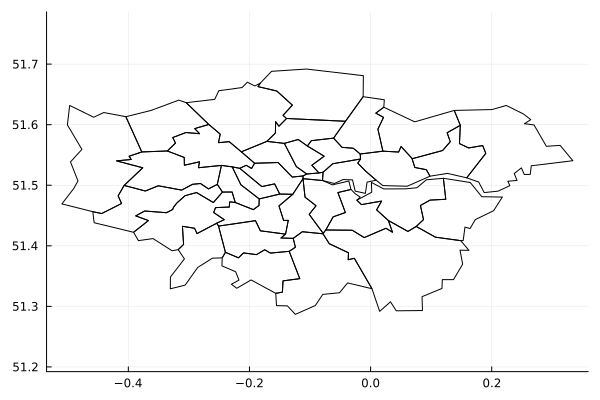

In [ ]:
canvas = plot(aspect_ratio=:equal)
for (idx, shape) in enumerate(features)
    plot_geometry!(canvas, shape.geometry; label="", color=:black)
end
canvas

## Reproject

In [ ]:
polygons = [feat.geometry.coordinates[1] for feat in features]
long_min, lat_min, long_max, lat_max = PolygonAlgorithms.bounds(polygons)
bounding_box = PolygonAlgorithms.box(long_min, lat_min, long_max, lat_max)
bbox_polygon = GeoJSON.Polygon(; bbox=nothing, coordinates=[bounding_box])

2D Polygonwith 1 sub-geometries

In [ ]:
long_avg = (long_min + long_max)/2
lat_avg = (lat_min + lat_max)/2
print(long_avg, " ", lat_avg)

-0.08786245 51.489315

In [ ]:
src_proj = WorldGeodeticSystem84()
radius = earth_radius_at_latitude(lat_avg)
dest_proj = TransverseMercator(;long0=long_avg, radius=radius, k=0.001f0) # convert to km

TransverseMercator{Float32}(radius=6.365018e6, long0=-0.08786245, k=0.001)

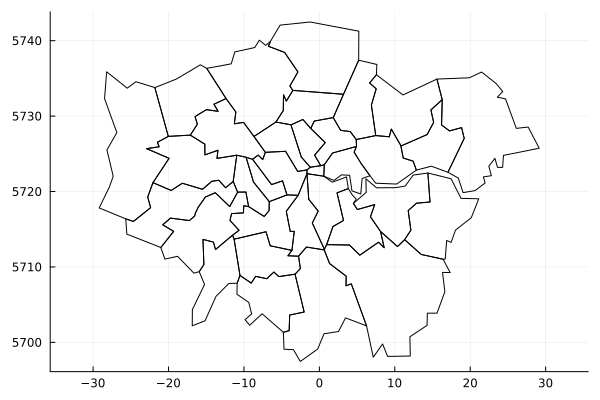

In [ ]:
canvas = plot(aspect_ratio=:equal)
for (idx, shape) in enumerate(features)
    projected = reproject(shape, src_proj, dest_proj)
    plot_geometry!(canvas, projected.geometry, label="", color=:black)
end
canvas

## Population Data

Source: https://hub.worldpop.org/

In [ ]:
raster_filepath = joinpath(data_dir, "gbr_ppp_2020_constrained.tif")

"C:\\Users\\sinai\\Documents\\Projects\\Python\\Geospatial\\data\\gbr_ppp_2020_constrained.tif"

In [ ]:
raster = Raster(raster_filepath)

12496×13196 Raster{Float32,2} with dimensions: 
  X Projected{Float64} LinRange{Float64}(-8.65042, 1.76208, 12496) ForwardOrdered Regular Intervals crs: WellKnownText,
  Y Projected{Float64} LinRange{Float64}(60.8604, 49.8646, 13196) ReverseOrdered Regular Intervals crs: WellKnownText
and reference dimensions: 
  Band Categorical{Int64} 1:1 ForwardOrdered
extent: Extent(X = (-8.650416617, 1.7629166749999985), Y = (49.864583335, 60.861249958))missingval: -99999.0f0crs: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]
parent:
               60.8604      60.8596      60.8587  …      49.8654      49.8646
 -8.65042  -99999.0     -99999.0     -99999.0        -99999.0     -99999.0
 -8.64958  -99999.0     -99999.0     -99999.0        -99999.0  

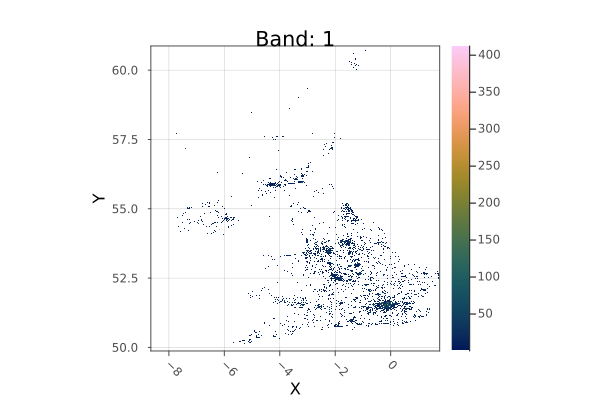

In [ ]:
plot(raster)

In [ ]:
region = trim(mask(raster; with=bbox_polygon));

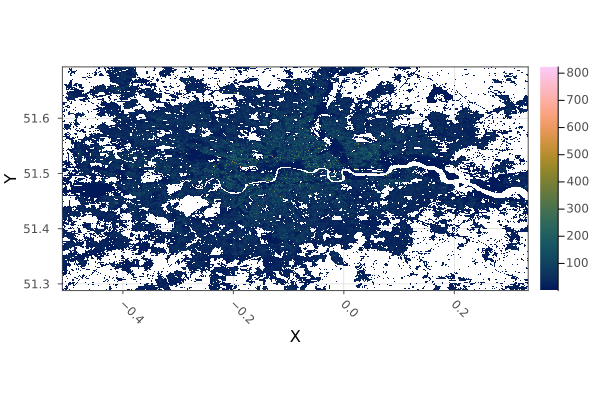

In [ ]:
plot(region)

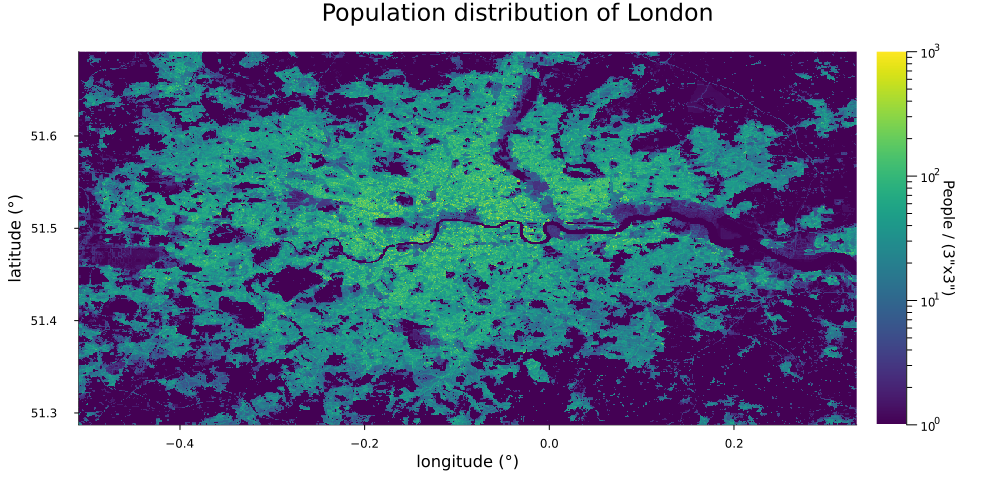

In [ ]:
img = permutedims(region.data)
img = img[end:-1:1, 1:end]
xs = region.dims[1].val.data
ys = reverse(region.dims[2].val.data)
img[img .< 0] .= 0;
height, width = size(img)
canvas = heatmap(xs, ys, (img .+ 1), 
    c=:viridis, 
    size=(1000, 480),
    aspect_ratio=:equal,
    xlims = (first(xs), last(xs)), ylims = (first(ys), last(ys)),
    xlabel="longitude (°)",
    ylabel="latitude (°)",
    plot_title="Population distribution of $region_name",
    colorbar_title="People / (3\"x3\")",
    colorbar_scale=:log10,
    colorbar_titlefontrotation=180,
    clims=(1, 1e3),
    tick_direction=:out,
    margin=5Plots.mm
)

In [ ]:
long_min, long_max = extrema(region.dims[1])
lat_min, lat_max = extrema(region.dims[2])
print("$long_min $long_max $lat_min $lat_max")
src_affine = affine_from_bounds(long_min, lat_min, long_max, lat_max, size(region)...)

-0.5095833159798346 0.3329166806760555 51.28708332935139 51.691249994413155

AffineTransform with matrix:
3×3 Matrix{Float64}:
 0.000833333   0.0          -0.510417
 0.0          -0.000833333  51.6921
 0.0           0.0           1.0

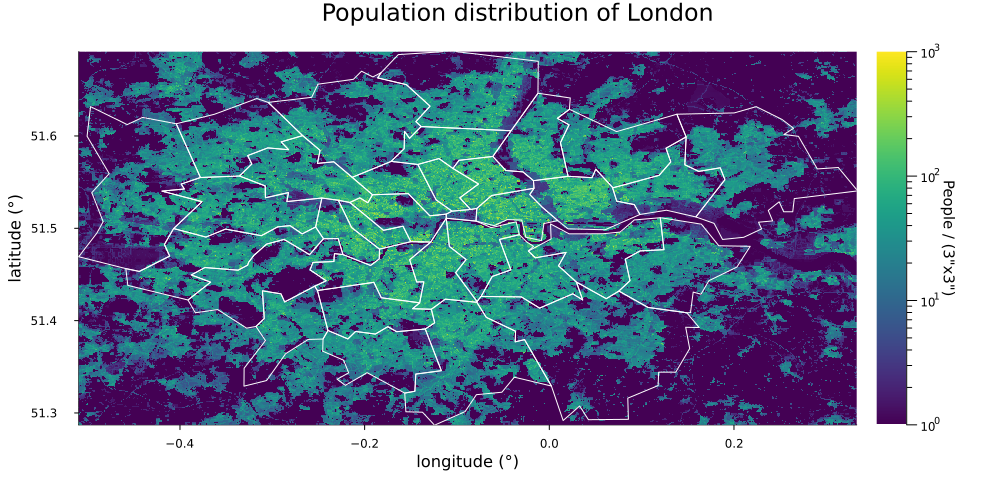

In [ ]:
for feat in features
    plot_geometry!(canvas, feat.geometry; c=:white, label="")
end
canvas

### Reproject

In [ ]:
width_dest, height_dest, dest_affine = calculate_suggested_transform(src_proj, dest_proj, width, height, src_affine)
println("($height, $width)")
println("($width_dest, $height_dest)")

(486, 1012)
(890, 684)


Require an inverse transform such that:

```Julia
imgw[I] = img[tform(I)]
```

The steps are:
1. Reverse indices: `(i, j)` to `(j, i)` because require `(x, y)` tuples.
2. Convert to destination projection co-ordinates: `(j, i)` to `(x, y)`.
3. Convert to spherical co-ordinates: `(x, y)` to `(long, lat)`.
4. Convert to source projection co-ordinates:: `(long, lat)` to `(x, y)`.
5. Convert to pixels: `(x, y)` to `(j, i)`.
6. Reverse: `(j, i)` to `(i, j)`.

In [ ]:
invA = inv(src_affine)
tform = idx -> idx |> reverse |> dest_affine |> inv(dest_proj) |> src_proj |> invA |> reverse

#81 (generic function with 1 method)

check tform

In [ ]:
out = similar(Array{Float32}, (height_dest, width_dest))
idx = CartesianIndices(axes(out))[end]
tform(idx.I)

(486.8980054791391, 1011.9938443871342)

In [ ]:
@time out_img = ImageTransformations.warp(img, tform, (height_dest, width_dest); method=bilinear);

  0.766012 seconds (5.28 M allocations: 140.463 MiB, 9.65% gc time, 42.95% compilation time)


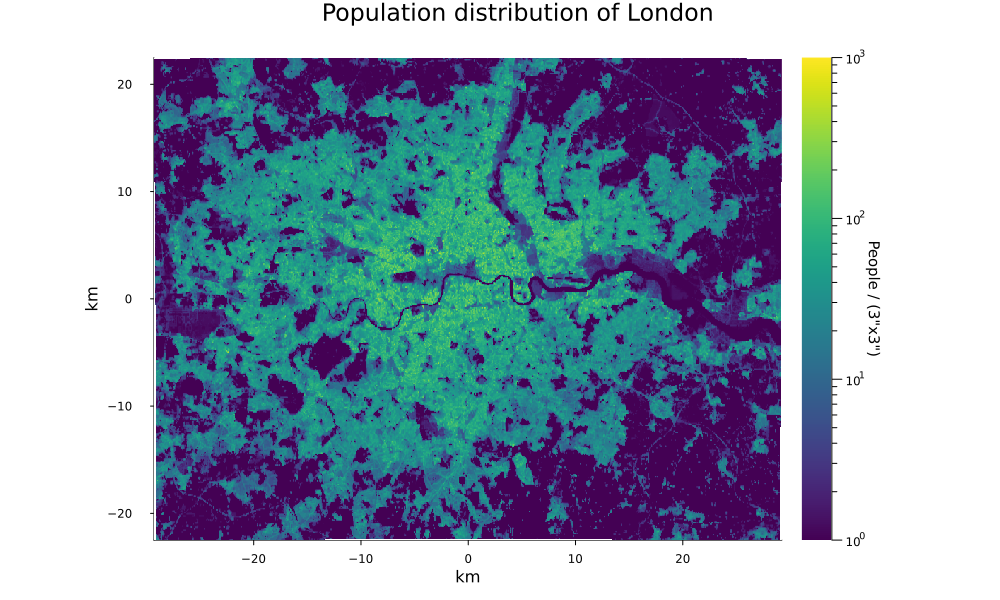

In [ ]:
xmin, ymax = dest_affine((1, 1))
xmax, ymin = dest_affine((width_dest, height_dest))
xs = LinRange(xmin, xmax, width_dest)
ymid = (ymax + ymin) / 2
ys = LinRange(ymin - ymid, ymax - ymid, height_dest)
canvas_proj = heatmap(xs, ys, (out_img .+ 1), 
    c=:viridis, 
    size=(1000, 600),
    aspect_ratio=:equal,
    xlims = (first(xs), last(xs)), ylims = (first(ys), last(ys)),
    xlabel="km",
    ylabel="km",
    plot_title="Population distribution of $region_name",
    colorbar_title="People / (3\"x3\")",
    colorbar_scale=:log10,
    colorbar_titlefontrotation=180,
    clims=(1, 1e3),
    tick_direction=:out,
    margin=5Plots.mm,
)

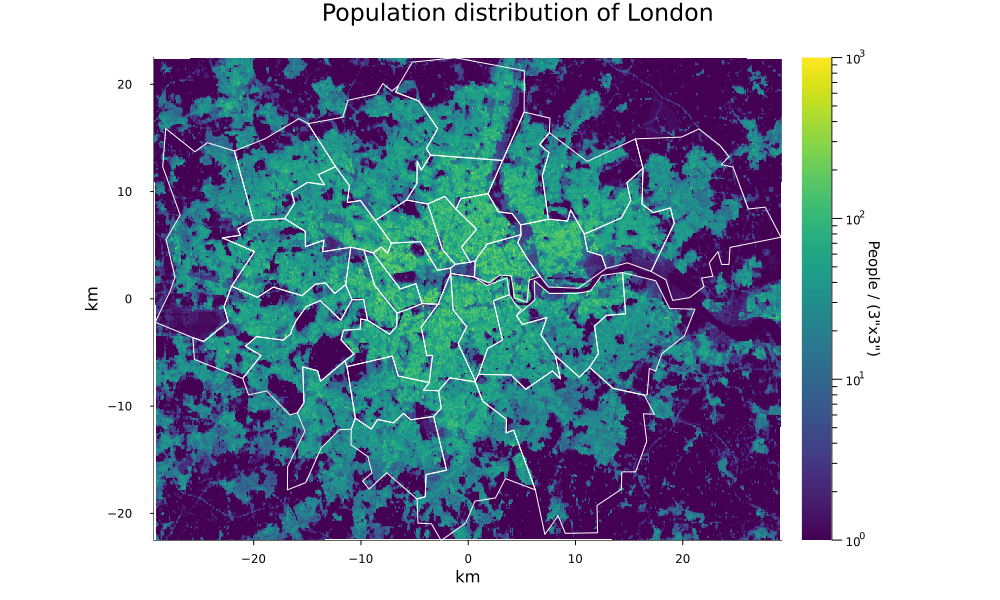

In [ ]:
inv_out_affine = inv(dest_affine)
features_proj = [reproject(feat, src_proj, xy-> xy |> dest_proj) for feat in features]
#canvas = plot(aspect_ratio=:equal, yflip=true)
for feat in features_proj
    geometry = translate(feat.geometry, (0.0, -ymid))
    plot_geometry!(canvas_proj, geometry; c=:white, label="")
end
canvas_proj

In [ ]:
savefig(canvas_proj, "population_distribution_$(region_name).png")

"C:\\Users\\sinai\\Documents\\Projects\\Julia\\Geospatial\\population_distribution_London.png"